<a href="https://colab.research.google.com/github/SudeepSarkar/sarkar-computer-vision-lectures/blob/main/CV_Module_8_1_Stereo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

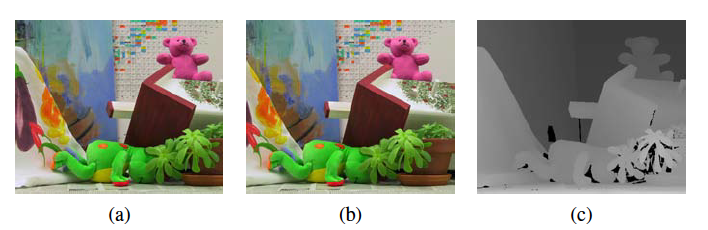

(a) Left stereo image (b) Right stereo image (c) Dense depth image. Depth is mapped to intensity for visualization: brighter means nearer.

# Stereo

Stereo is the estimation of the 3D depth of points given two scene images. We will be able to recover the depth of points in the scene visible to both cameras. We will assume that we know the geometry between the cameras taking the two views of the scene, i.e., we have calibrated cameras. This case for geometry estimation corresponds to the middle row of the table below.

You will learn about

* the most straightforward stereo camera setup, i.e., two cameras, just translated horizontally. We will also study the mathematical relationship between the image pixels of the two camera views in terms of disparity values

* how to establish dense correspondences between two images.

* about why you cannot estimate depth from just rotating camera images. 

* how to rectify general stereo images into standard, parallel stereo image pairs.

**Concepts Learned:** parallel camera stereo and matching, correspondences, disparity, general stereo geometry, epipolar geometry, epipolar constraint, epipolar lines, epipolar planes, and epipoles, essential matrix, fundamental matrix, rotating camera (panning) images, and rectification of images, and OpenCV stereo code.

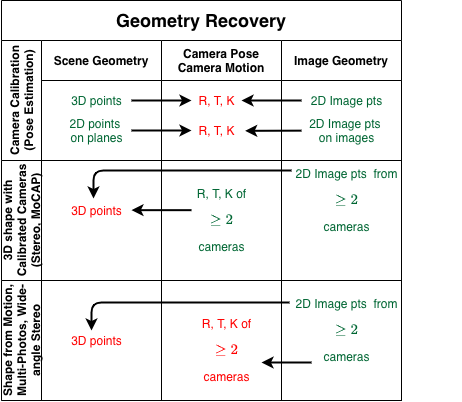

# Use of stereo images in self driving cars

KITTI Dataset

http://www.cvlibs.net/datasets/kitti/raw_data.php


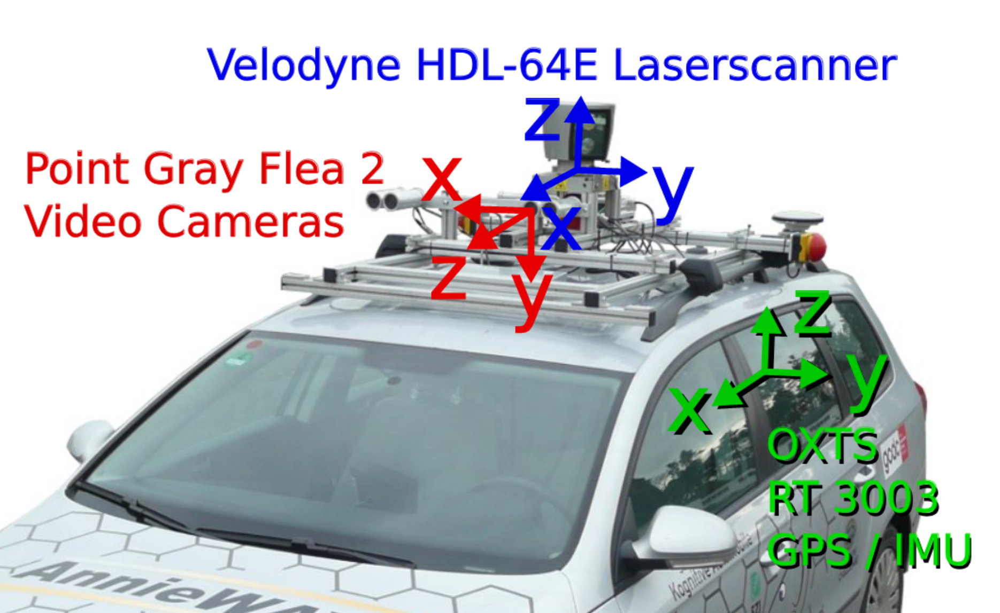

## Code: Example of stereo images

In [2]:
import numpy as np
import torch

import matplotlib.pyplot as plt
import scipy.ndimage as scimage
from skimage.transform import warp
import torch.nn as nn
from skimage import io

!pip install opencv-contrib-python==4.4.0.46
import cv2
print (cv2 .__version__)

np.set_printoptions(precision=4, suppress=True)
torch.set_printoptions(precision=4, sci_mode=False)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 MB 12.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.7.0.72
    Uninstalling opencv-contrib-python-4.7.0.72:
      Successfully uninstalled opencv-contrib-python-4.7.0.72
4.4.0


In [5]:
from google.colab import drive
drive.mount('/content/drive')
data_dir = '/content/drive/MyDrive/Colab Notebooks/CAP 6415 Computer Vision Online/data/'


Mounted at /content/drive


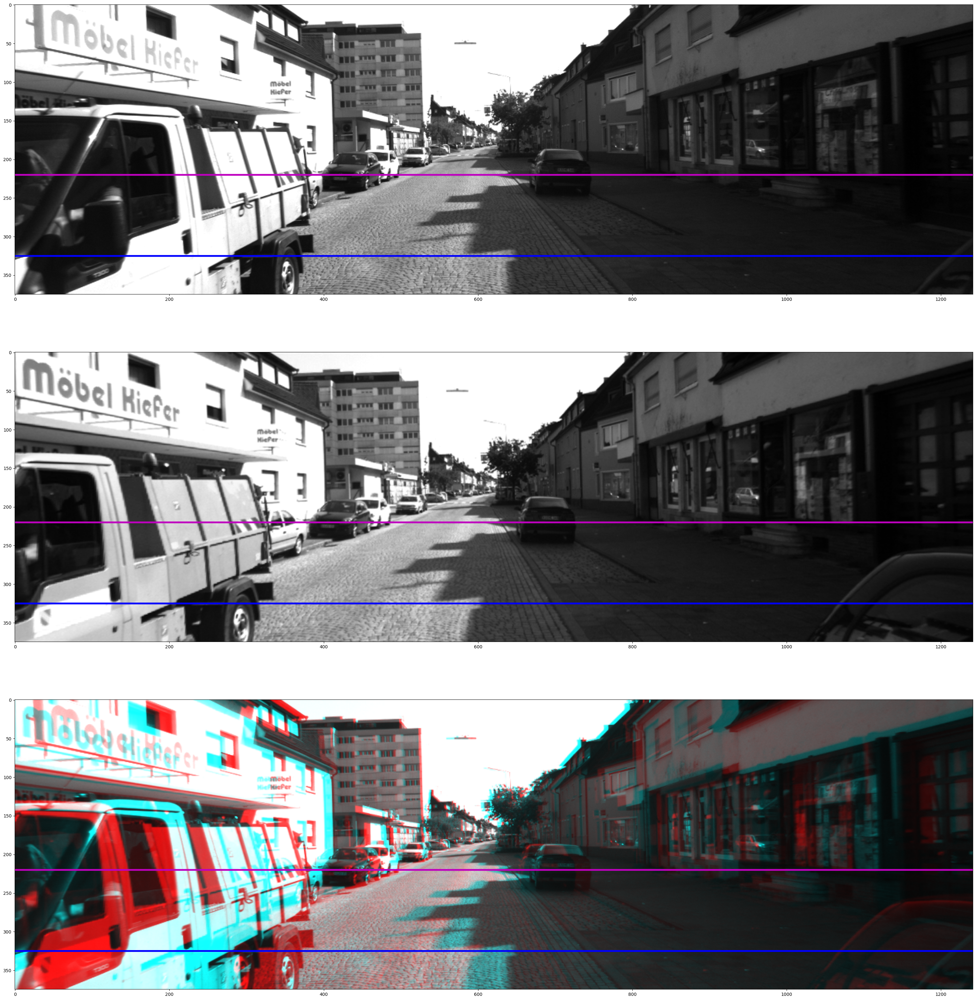

In [6]:
from skimage import io

image_1 = io.imread(data_dir+'2011_09_26_drive_0048_sync/image_00/data/0000000005.png')
image_2 = io.imread(data_dir+'2011_09_26_drive_0048_sync/image_03/data/0000000005.png')

image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB) # change from scikit image to cv2 format
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY) # change from color to gray
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

seq_im_2_into_1 = np.zeros((image_1.shape[0], image_1.shape[1], 3))
seq_im_2_into_1[..., 0] = image_2/255
seq_im_2_into_1[..., 1] = image_1/255
seq_im_2_into_1[..., 2] = image_1/255

#----------------------------------Display-------------------------------------------------------
# draw matches
fig, ((ax1), (ax2), (ax3)) = plt.subplots(3, 1)
fig.set_size_inches(80, 40)

ax1.imshow(image_1, 'gray')
ax1.plot(np.arange(0, image_2.shape[1]), 220*np.ones((image_2.shape[1],)), 'm', linewidth=4)
ax1.plot(np.arange(0, image_2.shape[1]), 325*np.ones((image_2.shape[1],)), 'b', linewidth=4);

ax2.imshow(image_2, 'gray')
ax2.plot(np.arange(0, image_2.shape[1]), 220*np.ones((image_2.shape[1],)), 'm', linewidth=4)
ax2.plot(np.arange(0, image_2.shape[1]), 325*np.ones((image_2.shape[1],)), 'b', linewidth=4);

ax3.imshow(seq_im_2_into_1, 'gray')
ax3.plot(np.arange(0, image_2.shape[1]), 220*np.ones((image_2.shape[1],)), 'm', linewidth=4)
ax3.plot(np.arange(0, image_2.shape[1]), 325*np.ones((image_2.shape[1],)), 'b', linewidth=4);

# Simpliest Stereo Geometry - Parallel cameras, Disparity and Depth



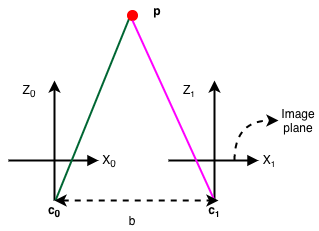

* http://withrobot.com/en/camera/ocams-1cgn-u/?ckattempt=1


* To simply the mathematics, let the world coordinates be centered and aligned with the left camera, i.e., $\mathbf{c_0} = \mathbf{0}$, $\mathbf{R_0} = \mathbf{I}$, and $\mathbf{T} = \mathbf{0}$. 

* There is just a translation between the two cameras along the $x$-axis, i.e., $\mathbf{R_1} = \mathbf{I}$ and $\mathbf{c_1} = \begin{bmatrix} b \\ 0 \\0 \end{bmatrix}$. 

* Let the 3D coordinate of the point $\mathbf{p}$ with respect to the left camera (or the world coordinate) be $\begin{bmatrix} X_0\\Y_0\\Z_0 \end{bmatrix}$. 

* The perspective projected location of this point in the left image will be $ (x_0, y_0) = (f \frac{X_0}{Z_0}, f\frac{Y_0}{Z_0})$

* The 3D coordinate of the point $\mathbf{p}$ with respect to the right camera  is $\begin{bmatrix} X_0-b\\Y_0\\Z_0 \end{bmatrix}$. 

* The perspective projected location of this point in the right image will be $ (x_1, y_1) = (f\frac{(X_0-b)}{Z_0}, f\frac{Y_0}{Z_0})$, where $b$ is the baseline between the two cameras.

* The corresponding points that the same $y$-coordinate ($y_1 = y_0$). They differ in $x$-coordinate. **The corresponding points are constrained to be along corresponding rows.**

* The **disparity** is between the $x$-coordinates is $\Delta x = x_0 - x_1 = f \frac{b}{Z_0}$.

* The depth of the point is given by 

\begin{equation}
Z_0 = f \frac{b}{x_0 - x_1}
\end{equation}

* The disparity is inversely proportional to the distance from the camera.


# Issues in stereo

* Relationship between baseline and disparity and range to search for correspondences.

* Capturing uncertainty in depth estimates

* Uncertainty in depth vs baseline

* Problem of occlusions, curved surfaces, repeated texture.

# Dense Correspondences

* To compute the depth of each point in the image, we have to find a match for it in the other image.

* Dense correspondences = we have matches, hence depth, for most of the pixels in the image.

    * For what kind of cases will you not have a match in the other image? 

* Dense correspondences can be created by matching image pixels along rows. Many approaches have been proposed in the literature. 

* The Middlebury Stereo dataset and evaluation is an excellent source of code and data

https://vision.middlebury.edu/stereo/

* One possibility ---
```
Input: Rectified image pairs: image_left, image_right
Output: Depth (or disparity) for each pixel in image_left
For each row 
    matches = dynamic_programming_warp (image_left(row, :), image_right(row, :), patch_similarity_function)
    depth(row,:) = infer_depth_from_disparity (matches)
end for
return(depth)
```


## Code: OpenCV Stereo code (another option)

* The algorithm is based on the Semi-Global Matching (SGM) stereo method described in the following paper.

    * Heiko Hirschmuller. [Stereo processing by semiglobal matching and mutual information](https://core.ac.uk/download/pdf/11134866.pdf). Pattern Analysis and Machine Intelligence, IEEE Transactions on, 30(2):328–341, 2008.

* "It uses a pixelwise, Mutual Information based matchingcost  for  compensating  radiometric  differences  of  input  images. Pixelwise matching is supported by a smoothness constraint that is  usually  expressed  as  a  global  cost  function. SGM  performs a  fast  approximation  by  pathwise  optimizations  from  all  directions. The  discussion  also  addresses  occlusion  detection,sub-pixel refinement and multi-baseline matching. Additionally, post-processing  steps  for  removing  outliers,  recovering  from  specific problems  of  structured  environments  and  the  interpolation of gaps   are   presented."

* OpenCV code disparity map from stereo images    https://docs.opencv.org/master/dd/d53/tutorial_py_depthmap.html

* Some practical tips are here - http://wiki.ros.org/stereo_image_proc/Tutorials/ChoosingGoodStereoParameters




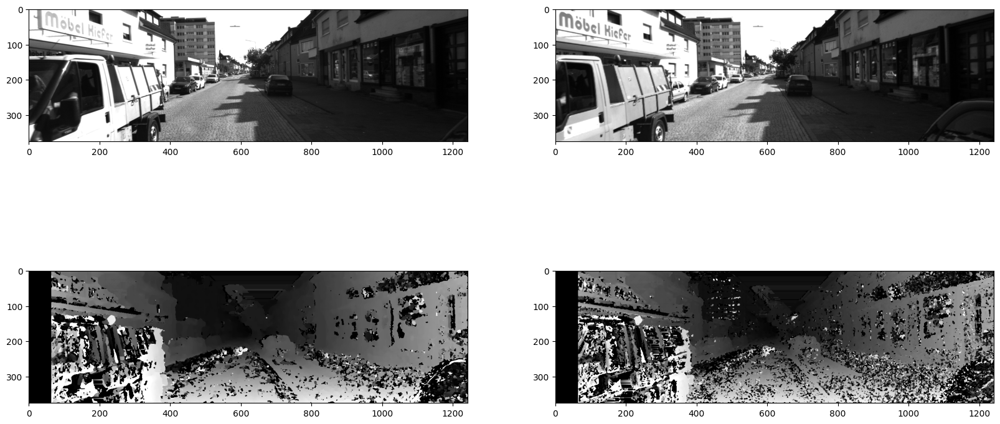

In [7]:
''' Read in the images '''
image_1 = io.imread(data_dir+'2011_09_26_drive_0048_sync/image_00/data/0000000005.png')
image_2 = io.imread(data_dir+'2011_09_26_drive_0048_sync/image_03/data/0000000005.png')
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB) # change from scikit image to cv2 format
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY) # change from color to gray
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

#Create Block matching object. 
stereo_10 = cv2.StereoSGBM_create(numDisparities=64, blockSize=10)
disparity_10 = stereo_10.compute(image_1, image_2)

#Create Block matching object. 
stereo_5 = cv2.StereoSGBM_create(numDisparities=64, blockSize=5)
disparity_5= stereo_5.compute(image_1, image_2)


fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)
fig.set_size_inches(20, 10)
ax1.imshow(image_1, 'gray')
ax2.imshow(image_2, 'gray')
ax3.imshow(disparity_10,'gray');
ax4.imshow(disparity_5,'gray');


# General Stereo: WILDTRACK dataset

"[WILDTRACK: A Multi-Camera HD Dataset for Dense Unscpted Pedestrian Detection](https://openaccess.thecvf.com/content_cvpr_2018/html/Chavdarova_WILDTRACK_A_Multi-Camera_CVPR_2018_paper.html)," Tatjana Chavdarova, Pierre Baqué, Stéphane Bouquet, Andrii Maksai, Cijo Jose, Timur Bagautdinov, Louis Lettry, Pascal Fua, Luc Van Gool, François Fleuret; Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2018, pp. 5030-5039 

The full dataset is available at https://www.epfl.ch/labs/cvlab/data/data-wildtrack/


# Epipolar Constraint, Epipolar Plane, Epipolar Lines, Epipoles

* For every point in one of the images, its corresponding point has to be along the **epipolar line**.

* The 3D point and the centers of the camera define an **epipolar plane**.

* The epipolar plane intersects the two image planes along **epipolar lines**.

* Points on corresponding epipolar lines between the two images must be matched. This is known as the **epipolar constraint**.

* **Note that the same relationship exists for any 2-frames of a motion (video) sequence from a moving camera.**

* In the figure below, the three vectors from $\overline{\mathbf{c}_0 \mathbf{c}_1}$,  $\overline{\mathbf{c}_0 \mathbf{p}}$, and $\overline{\mathbf{c}_1 \mathbf{p}}$, all line on a plane. We ignore that image locations are quantized in pixel units, and the rays might not pass through the same 3D point in practice.



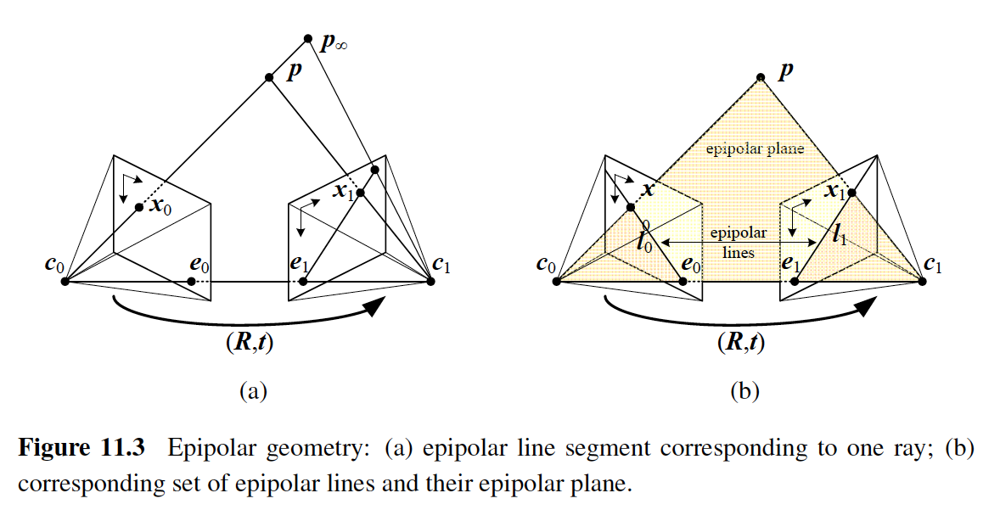

# Essential Matrix

* Recall the perspective camera model

\begin{eqnarray} 
    \begin{bmatrix} x_1 \\ x_2 \\ x_3 \end{bmatrix} & = &
    \begin{bmatrix} -f & 0 & c_x  \\ 0 & -af & c_y  \\ 0 & 0 & 1  \end{bmatrix}
    \begin{bmatrix} 
    r_{00} & r_{01} & r_{02} & t_x \\ 
    r_{10} & r_{11} & r_{12} & t_y \\
    r_{20} & r_{21} & r_{22} & t_z 
    \end{bmatrix}
    \begin{bmatrix}
    X_p \\ Y_p \\ Z_p \\ 1
    \end{bmatrix} \\
    \mathbf{\tilde{x}} = \begin{bmatrix} x_s \\  y_s \\ 1 \end{bmatrix} 
    & = &
    \begin{bmatrix} 
    \frac{x_1}{x_3} \\
    \frac{x_2}{x_3} \\ 1
    \end{bmatrix} \\ \\ 
\end{eqnarray}

* We can combine the above equations as 
\begin{eqnarray}
x_3 \mathbf{\tilde{x}} & = & \mathbf{K} ( \mathbf{R} \mathbf{\tilde{p}}  + \mathbf{t})
\end{eqnarray}

* In stereo, we have two calibrated cameras. To simplify the mathematics, we will consider the world coordinate system centered on one of the cameras, $\mathbf{c}_0$.

* The rotation matrix $\mathbf{R}$ and the translation vector $\mathbf{t}$ takes coordinates with respect to $\mathbf{c}_0$ and expresses it with respect to the second camera, $\mathbf{c}_1$.

* The two equations that relate the image coordinates to the respective 3D coordinates for the two cameras are

\begin{eqnarray}
x_3 \mathbf{\tilde{x}_0} & = & \mathbf{K_0} \mathbf{\tilde{p}_0} \\ 
x_3' \mathbf{\tilde{x}_1} & = & \mathbf{K_1} ( \mathbf{R} \mathbf{\tilde{p}_0}  + \mathbf{t})
\end{eqnarray}

* The above two equations can be combined into one equation by using the expression for $\mathbf{\tilde{p}_0} = x_3 \mathbf{K_0}^{-1} \mathbf{\tilde{x}_0}$ from the first equation.

\begin{eqnarray}
x_3' \mathbf{\tilde{x}_1} & = & \mathbf{K_1} ( \mathbf{R} ( x_3 \mathbf{K_0}^{-1} \mathbf{\tilde{x}_0})   + \mathbf{t}) \\ 
x_3' \mathbf{K_1}^{-1} \mathbf{\tilde{x}_1} & = &  x_3 \mathbf{R} \mathbf{K_0}^{-1} \mathbf{\tilde{x}_0}   + \mathbf{t} \\ 
\end{eqnarray}

* To reduce  notational clutter, let $\mathbf{\hat{x}_0} =  \mathbf{K_0}^{-1} \mathbf{\tilde{x}_0} $ and $\mathbf{\hat{x}_1} =  \mathbf{K_1}^{-1} \mathbf{\tilde{x}_1} $. 
    * Both $\mathbf{\hat{x}_0}$ and $\mathbf{\tilde{x}_0}$ refer to the 2D location of the same pixel in an image. One is with respect to the optical center of the image, and the other is the array index, scaled by the focal length. They are related by the intrinsic parameter matrix $\mathbf{K_0}$

* Using these intrinsic parameter normalized indices, we have the following relationship between the coordinates of the two images.

\begin{eqnarray}
x_3' \mathbf{\hat{x}_1} & = &  x_3 \mathbf{R} \mathbf{\hat{x}_0}   + \mathbf{t} \\ 
\end{eqnarray}

* Take a cross product with vector $\mathbf{t}$ of both sides. Note $\mathbf{t} \times \mathbf{t} = 0$.

\begin{eqnarray}
x_3' \mathbf{t} \times \mathbf{\hat{x}_1} & = &  x_3 \mathbf{t} \times \mathbf{R} \mathbf{\hat{x}_0}
\end{eqnarray}

* Take dot product with $\mathbf{\hat{x}_1}$. The left-hand side will be zero. Note that the scaling constants $x_3$ and $x_3'$ are not part of this final relationship.

\begin{eqnarray}
    \mathbf{\hat{x}_1}^T (\mathbf{t} \times \mathbf{R} \mathbf{\hat{x}_0}) & = & 0 \\
\end{eqnarray}
   
* Any cross-product can be written as matrix multiplication with a skew-symmetric matrix.

\begin{eqnarray}
    \mathbf{\hat{t}} \times \mathbf{a} & = &
    \begin{vmatrix}
    i & j & k \\ 
    \hat{t}_x & \hat{t}_y & \hat{t}_z\\ 
    a_0 & a_1 & a_2 
    \end{vmatrix} \\ 
    [\mathbf{\hat{t}}]_{\times} \mathbf{a} & = & 
    \begin{bmatrix}
    0 & -\hat{t}_z & \hat{t}_y \\ \hat{t}_z & 0 & -\hat{t}_x \\ -\hat{t}_y & \hat{t}_x & 0
    \end{bmatrix}
     \begin{bmatrix}
     a_{0} \\ a_{1} \\ a_{2}
     \end{bmatrix}
\end{eqnarray}

* Using this, we arrive at the following expression. 

\begin{eqnarray}
    \mathbf{\hat{x}_1}^T \left [\mathbf{t} \times \mathbf{R} \mathbf{\hat{x}}_0 \right ] & = & 0 \\
    \begin{bmatrix}
        \hat{x}_1 & \hat{y}_1 & 1
    \end{bmatrix}
    \begin{bmatrix}
    0 & -\hat{t}_z & \hat{t}_y \\ \hat{t}_z & 0 & -\hat{t}_x \\ -\hat{t}_y & \hat{t}_x & 0
    \end{bmatrix} 
    \begin{bmatrix}
    r_{00} & r_{01} & r_{02} \\
    r_{10} & r_{11} & r_{12} \\
    r_{20}  & r_{21} & r_{22}
    \end{bmatrix}
    \begin{bmatrix}
        \hat{x}_0 \\ \hat{y}_0 \\ 1
    \end{bmatrix} & = & 0
\end{eqnarray}




* The 3 by 3 matrix $\mathbf{E} = \mathbf{t} \times \mathbf{R}$ is called the **essential matrix**.

\begin{eqnarray}
    \mathbf{E} & = & 
    \begin{bmatrix}
    0 & -\hat{t}_z & \hat{t}_y \\ \hat{t}_z & 0 & -\hat{t}_x \\ -\hat{t}_y & \hat{t}_x & 0
    \end{bmatrix} 
    \begin{bmatrix}
    r_{00} & r_{01} & r_{02} \\
    r_{10} & r_{11} & r_{12} \\
    r_{20}  & r_{21} & r_{22}
    \end{bmatrix}
\end{eqnarray}


* Using this, we can express the constraint between the corresponding points, specified with respect to the center of the image (camera coordinates) in the two views as
\begin{eqnarray}
    \begin{bmatrix}
    \hat{x}_1 & \hat{y}_1 & 1
    \end{bmatrix}
     \begin{bmatrix}
     e_{00} & e_{01} & e_{02} \\
     e_{10} & e_{11} & e_{12} \\
     e_{20} & e_{21} & e_{22}
     \end{bmatrix}
     \begin{bmatrix}
    \hat{x}_0 \\  \hat{y}_0 \\ 1
    \end{bmatrix}
       & = & 0 \\
    \hat{\mathbf{x}}_1^T \mathbf{E} \hat{\mathbf{x}}_0 & = & 0
\end{eqnarray}


# Assignment -- essential matrix for parallel stereo

What is the essential matrix for parallel view stereo? Write the equations for the corresponding epipolar lines.

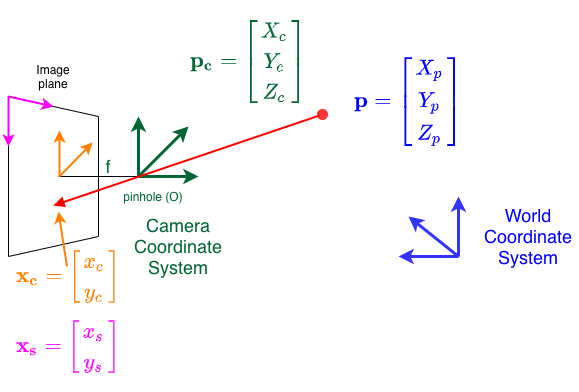

# Fundamental Matrix vs. Essential Matrix

* The **essential matrix** relates the homogenous coordinates of the corresponding points in the two images that are expressed **with respect to the center of the image.**

* We can have a similar relationship between the array-based pixel coordinates, and we have to use the intrinsic parameters. 

* $\mathbf{\hat{x}}_j = \mathbf{K}_j^{-1} \mathbf{\tilde{x}}_j$.

* Plugging this relationship into the essential matrix relationship, we have the following relationship.

\begin{eqnarray}
\hat{\mathbf{x}}_1^T \mathbf{E} \hat{\mathbf{x}}_0 & = & 0 \\
(\mathbf{K}_1^{-1} \mathbf{\tilde{x}}_1)^T \mathbf{E} (\mathbf{K}_0^{-1} \mathbf{\tilde{x}}_0) & = & 0 \\
(\mathbf{\tilde{x}}_1^T \mathbf{K}_1^{-T})  \mathbf{E} (\mathbf{K}_0^{-1} \mathbf{\tilde{x}}_0) & = & 0 \\
\mathbf{\tilde{x}}_1^T (\mathbf{K}_1^{-T} \mathbf{E} \mathbf{K}_0^{-1}) \mathbf{\tilde{x}}_0 & = & 0\\
\mathbf{\tilde{x}}_1^T \mathbf{F} \mathbf{\tilde{x}}_0 & = & 0\\
\end{eqnarray}

* Thus, the epipolar constraint can be expressed with the pixel coordinates, $\mathbf{\tilde{x}}_j$, using the **fundamental matrix**. The relationship between the fundamental and essential matrices is:

\begin{equation}
    \mathbf{F} = \mathbf{K_1}^{-T} \mathbf{E} \mathbf{K_0}^{-1}
\end{equation}


# Assignment -- corresponding epipolar lines

We can use the equation we just derived to specify the corresponding epipolar lines in the two images: $\mathbf{\tilde{x}}_1^T \mathbf{F} \mathbf{\tilde{x}}_0 = 0$
\begin{equation}
\begin{bmatrix} x_1 & y_1 & 1 \end{bmatrix}
\begin{bmatrix}
f_{00} & f_{01} & f_{02} \\ 
f_{10} & f_{11} & f_{12} \\ 
f_{20} & f_{21} & f_{22} \\ 
\end{bmatrix}
\begin{bmatrix} x_0 \\ y_0 \\ 1 \end{bmatrix} = 0
\end{equation}

For a pixel location $(a, b)$ in the image for camera $\mathbf{c}_0$, what is the corresponding epipolar line in $\mathbf{c}_1$? Think of using homogenous representations of points and lines.

For a point in this epioplar line in $\mathbf{c}_1$, show that the corresponding epipolar line in $\mathbf{c}_0$ passes through $(a, b)$.



# Code: Epipolar Lines

##Code: `compute_essential_fundamental_matrices` from calibrated cameras

In [ ]:
# Compute essential and fundamental matrices from R, T, K matrices that are returned from calibration
def compute_essential_fundamental_matrices (R_left, T_left, K_left, R_right, T_right, K_right) :
    ''' Given the calibrations of each of the cameras with respect to the world, it return essential (E)
    and fundamental (F) matrices. '''
    R_lr =  R_right @ np.transpose(R_left) # rotation matlrix to align a pt in left image to right image
    T_r =  T_right - R_lr @ T_left   # translation vector to the left camera from the right camera, with respect to the right camera 

    '''Epipolar constraint matrix (Essential matrix)'''
    E = np.zeros((3,3))
    E[:,0] = np.cross(T_r, R_lr[:,0]) # essential matrix
    E[:,1] = np.cross(T_r, R_lr[:,1])
    E[:,2] = np.cross(T_r, R_lr[:,2])

    ''' Fundamental matrices -- to express in terms of array coordinates '''
    K_left_inv = np.linalg.inv(K_left)
    K_right_inv = np.linalg.inv(K_right)
    F = np.transpose(K_right_inv) @ E @ K_left_inv  # Fundamental matrix -- includes intrinsic parameters
    return (E, F, R_lr, T_r)

## Code: `epipolar_lines`

In [ ]:
# Code to compute epipolar lines corresponding to a given point in the left image.

def epipolar_lines (F, point_left, image_left_size, image_right_size) :
    '''
    F is 3 by 3 fundamental matrix
    point_left is 2 by 1 vector of point in the left image
    image_left_size, image_right_size are the sizes of the two images
    It returns pairs of corresponding epiolar lines 
    (i) epipolar line passing through the point in the left image and
    (ii) epipolar line in the right image corresponding to the point in the left image.
    '''

    pts = np.row_stack ((point_left, [1])) # homogenous represention

    line_right = F @ pts # homogenous coordinates of the epipolar line, line_right is 3 by 1

    # The following code computes a set of points on the epiolar line in the right image that can be ploted
    # Coordinates of the epipolar line on right image for the point p_right
    x_right = np.arange(0, image_right_size[1]) # uniformly spread x coordinates
    y_right = (-line_right[0]*x_right - line_right[2])/line_right[1] # corresponding y-coordinates
    
    # select only the part of the line that falls within the image
    x_right = x_right[(y_right[:] > 0),]; 
    y_right = y_right[(y_right[:] > 0),];
    x_right = x_right[(y_right[:] < image_right_size[0]),] 
    y_right = y_right[(y_right[:] < image_right_size[0]),]
    
    # The following code computes a set of points on the epiolar line in the left image that can be ploted 
    if (x_right.any()) : # if the right epiolar line is inside the image boundary
        p_right = np.array([x_right[0], y_right[0], 1]) # pick a point on the line

        line_left = p_right @ F

        # Coordinates of the epipolar line on left image for the point p_right
        x_left = np.arange(0, image_left_size[1])
        y_left = (-line_left[0]*x_left - line_left[2])/line_left[1]
        # select only the part of the line that falls within the image
        x_left = x_left[(y_left[:] > 0),]; 
        y_left = y_left[(y_left[:] > 0),];
        x_left = x_left[(y_left[:] < image_left_size[0]),] 
        y_left = y_left[(y_left[:] < image_left_size[0]),]
    
    if (x_right.any()) :
        if (x_left.any()) :
            return(x_left, y_left, x_right, y_right)
    return(np.array([]), np.array([]), np.array([]), np.array([]))       

## Transformation  between cameras and the world

Consider two cameras calibrated to a third, world coordinate system. We have three coordinate systems: two coordinate systems with respect to the cameras and the world coordinate system.

Let $\mathbf{R}_l$ and $\mathbf{t}_l$ be the rotation and translation that transforms the coordinates of a 3D point with respect to the world to the coordinates with respect to the $l$-th camera.

Let $\mathbf{R}_r$ and $\mathbf{t}_r$ be the rotation and translation that transforms the coordinates of a 3D point with respect to the world to the coordinates with respect to the $r$-th camera.

We have:

1. $\mathbf{R}_l^{T}$ and $-\mathbf{R}_l^{T}\mathbf{t}_l$ are the rotation and translation that transforms the coordinates of a 3D point with respect to the $l$-th camera to the coordinates with respect to the world.

2. $\mathbf{R}_r \mathbf{R}_l^{T}$ and $(\mathbf{t}_r - \mathbf{R}_r \mathbf{R}_l^{T}\mathbf{t}_l)$ are the rotation and translation that transforms the coordinates of a 3D point with respect to the $l$-th camera to the coordinates with respect to the $r$-th camera.

3. Show that the location of the origin of the left camera with respect to the world coordinates is $-\mathbf{R}_l^{T}\mathbf{t}_l$.


## Code: Read calibration data from WILDTRACK dataset

In [ ]:
!pip install xmltodict
import xmltodict
from scipy.spatial.transform import Rotation 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/



Extrinsic (camera 0) xmlDict:
 {'opencv_storage': {'rvec': '1.759099006652832 0.46710100769996643 -0.331699013710022', 'tvec': '-525.8941650390625 45.40763473510742 986.7235107421875'}}
Intrinsic xmlDict:
 {'opencv_storage': {'camera_matrix': {'@type_id': 'opencv-matrix', 'rows': '3', 'cols': '3', 'dt': 'd', 'data': '1743.4478759765625 0.0 934.5202026367188 0.0 1735.1566162109375 444.3987731933594 0.0 0.0 1.0'}, 'distortion_coefficients': {'@type_id': 'opencv-matrix', 'rows': '5', 'cols': '1', 'dt': 'd', 'data': '0 0 \n    0 0\n    0'}}}

Extrinsic (camera 1) xmlDict:
 {'opencv_storage': {'rvec': '0.6167870163917542 -2.14595890045166 1.6577140092849731', 'tvec': '1195.231201171875 -336.5144958496094 2040.53955078125'}}
Intrinsic xmlDict:
 {'opencv_storage': {'camera_matrix': {'@type_id': 'opencv-matrix', 'rows': '3', 'cols': '3', 'dt': 'd', 'data': '1707.266845703125 0.0 978.1306762695312 0.0 1719.0408935546875 417.01922607421875 0.0 0.0 1.0'}, 'distortion_coefficients': {'@type_id': 

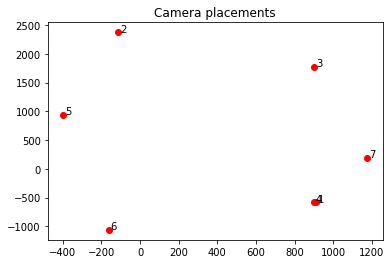

In [ ]:
# Read calibration data of the WILDTRACK dataset. There are seven cameras arranged around an outdoor space.
calib_dir = data_dir+'Wildtrack/calibrations/'
extrinsic_calibration_files = ['extrinsic/extr_CVLab1.xml', 'extrinsic/extr_CVLab2.xml', 'extrinsic/extr_CVLab3.xml',
                               'extrinsic/extr_CVLab4.xml', 'extrinsic/extr_IDIAP1.xml', 'extrinsic/extr_IDIAP2.xml',
                               'extrinsic/extr_IDIAP3.xml']
intrinsic_calibration_files = ['intrinsic_zero/intr_CVLab1.xml', 'intrinsic_zero/intr_CVLab2.xml', 'intrinsic_zero/intr_CVLab3.xml',
                               'intrinsic_zero/intr_CVLab4.xml', 'intrinsic_zero/intr_IDIAP1.xml', 'intrinsic_zero/intr_IDIAP2.xml',
                               'intrinsic_zero/intr_IDIAP3.xml']
R_list = [] # list of rotations, w.r.t individual cameras
T_list = [] # list of translations, w.r.t individual cameras
K_list = [] # list of intrinsic parameters for individual cameras
c_list = [] # list of camera locations w.r.t world coordinates
for i in range(7) :
    #read extrinsic parameters
    extr_file = calib_dir + extrinsic_calibration_files[i]
    xml_data = open(extr_file, 'r').read()  # Read data
    xmlDict = xmltodict.parse(xml_data)  # Parse XML
    print('\nExtrinsic (camera {}) xmlDict:\n'.format(i), xmlDict)
    rot_rodriges = np.fromstring(xmlDict['opencv_storage']['rvec'], sep=' ') # rotation information stored in Rodriges format \theta * (axis)
    R = Rotation.from_rotvec(rot_rodriges).as_matrix()
    R_list.append(R)
    T = np.fromstring(xmlDict['opencv_storage']['tvec'], sep=' ')
    T_list.append(T)
    c_list.append(-np.transpose(R_list[i]) @ T_list[i][:,None]) # location of the camera coordinates w.r.t. world coordinates

    plt.title('Camera placements')
    plt.plot(c_list[i][0], c_list[i][1], 'ro')
    plt.text(c_list[i][0]+10, c_list[i][1]+10, '{}'.format(i+1))

    # read intrinsic parameters
    intr_file = calib_dir + intrinsic_calibration_files[i]
    xml_data = open(intr_file, 'r').read()  # Read data
    xmlDict = xmltodict.parse(xml_data)  # Parse XML
    print('Intrinsic xmlDict:\n', xmlDict)
    K_mat = np.fromstring(xmlDict['opencv_storage']['camera_matrix']['data'], sep=' ').reshape(3,3)
    K_list.append(K_mat)
    
#print('Rotation matrices=\n', R_list)
#print('Translation vectors=\n', T_list)
#print('Intrnsic matrices=\n', K_list)
#print('Camera centers=\n', c_list)

# Form P array of N_cameras by 3 by 4
N = len(R_list)
P_mat = np.zeros((N, 3, 4))
for j in range(N) :
    P_mat[j,:,:] = K_list[j] @ np.column_stack((R_list[j], T_list[j]))
    
#print ('Projective matrices =\n', P_mat)


## Code: Read Wildtrack images

Essential matrix:
 [[ 5.9448 -6.9039  8.3612]
 [10.1736  0.8946  3.9693]
 [-7.812  -9.8714  4.4239]]
Fundamental matrix:
 [[ 0.     -0.      0.004 ]
 [ 0.      0.     -0.0012]
 [-0.0079 -0.0037  8.7071]]


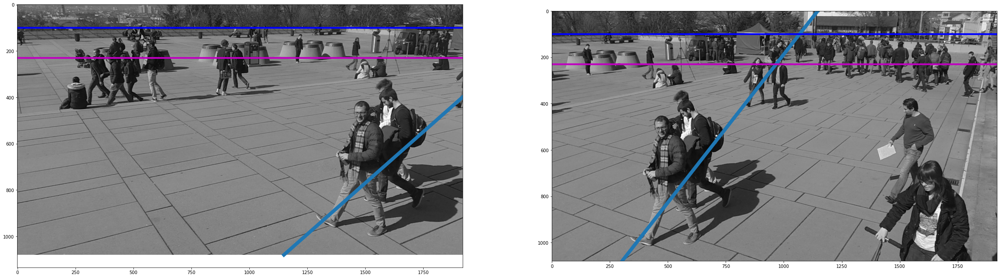

In [ ]:
''' Read in the images '''
image_1 = io.imread(data_dir+'Wildtrack/C4/00000015.png')
image_2 = io.imread(data_dir+'Wildtrack/C1/00000015.png')
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB) # change from scikit image to cv2 format
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY) # change from color to gray
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

E, F, R, T = compute_essential_fundamental_matrices (R_list[3], T_list[3], K_list[3], R_list[0], T_list[0], K_list[0])
print('Essential matrix:\n', E)
print('Fundamental matrix:\n', F)
K_left = K_list[3]
K_right = K_list[0]

#----------------------------------Display-------------------------------------------------------

# Picked a corresponding point across the 7 cameras corresponding to the shoe-tip of a person 
shoe_tip = np.array([[831, 401], [0, 0], [967, 346], [1882, 432], [1650, 580], [620, 335], [765, 398]])
p1 = shoe_tip[3]; p2 = shoe_tip[0]

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(40, 20)

ax1.imshow(image_1, 'gray')
ax1.plot(p1[0], p1[1], 'bo')
ax2.imshow(image_2, 'gray')
ax2.plot(p2[0], p2[1], 'bo')

x_1, y_1, x_2, y_2 = epipolar_lines (F, p1[:,None], image_1.shape, image_2.shape)
ax1.plot(x_1, y_1, linewidth=8)
ax2.plot(x_2, y_2, linewidth=8);

# drawing the following horizontal lines just to illustrate that even though visually
# it seems that they are good fit as epipolar lines, but they are not!
ax1.plot(np.arange(0, image_2.shape[1]), 230*np.ones((image_2.shape[1],)), 'm', linewidth=4)
ax1.plot(np.arange(0, image_2.shape[1]), 100*np.ones((image_2.shape[1],)), 'b', linewidth=4)
ax2.plot(np.arange(0, image_2.shape[1]), 230*np.ones((image_2.shape[1],)), 'm', linewidth=4)
ax2.plot(np.arange(0, image_2.shape[1]), 100*np.ones((image_2.shape[1],)), 'b', linewidth=4)


## Code: Family of epipolar lines

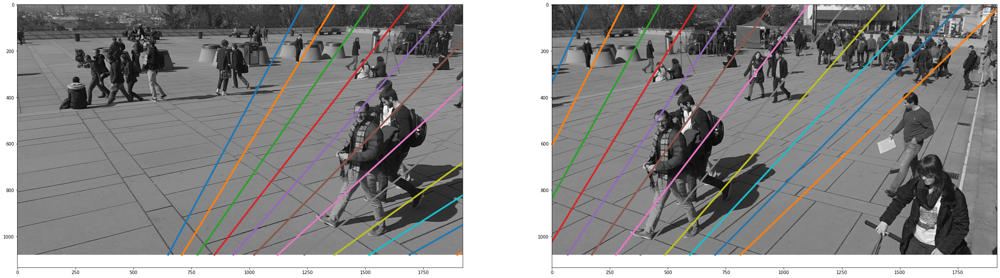

In [ ]:
fig, (ax1, ax2) = plt.subplots( 1, 2)
fig.set_size_inches(40, 20)
ax1.imshow(image_1, 'gray')

ax2.imshow(image_2, 'gray')

for i, j in zip(range(0, np.max(image_1.shape), 50), range(0, np.max(image_1.shape), 50)):
    p1 = [[i], [j]]
    x_1, y_1, x_2, y_2 = epipolar_lines (F, p1, image_1.shape, image_2.shape)
    if (x_1.any()) :
        ax2.plot(x_2, y_2, linewidth=4)
        ax1.plot(x_1, y_1, linewidth=4)

## Code: Epipolar lines on KITTI stereo images

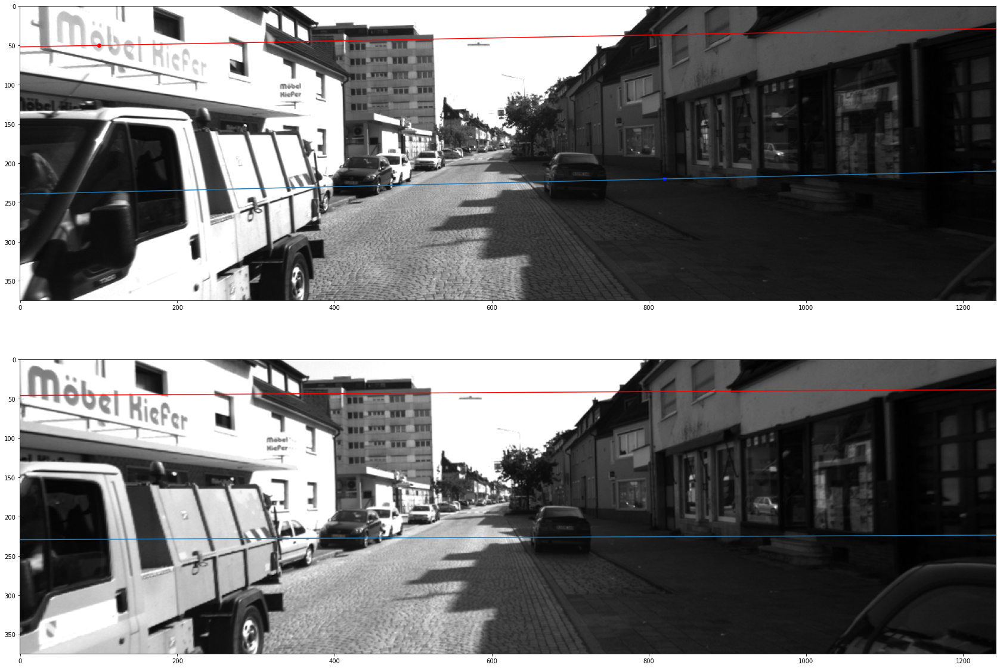

In [ ]:
# Work with KITTI images -- from Camera00 and Camera03 - between the two stereo cameras
'''
KITTI Calibration information for the two pairs of stereo cameras.
'''
R_rect_00 = np.array([9.999239e-01, 9.837760e-03, -7.445048e-03, -9.869795e-03, 9.999421e-01, -4.278459e-03, 7.402527e-03, 4.351614e-03, 9.999631e-01]).reshape(3, 3)
P_rect_00 = np.array([7.215377e+02, 0.000000e+00, 6.095593e+02, 0.000000e+00, 0.000000e+00, 7.215377e+02, 1.728540e+02, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00]).reshape(3, 4)
K_rect_00 = P_rect_00[0:3,0:3]
T_rect_00 = np.linalg.inv(K_rect_00) @ P_rect_00[0:3,3]

R_rect_01 = np.array([ 9.996878e-01, -8.976826e-03, 2.331651e-02, 8.876121e-03, 9.999508e-01, 4.418952e-03, -2.335503e-02, -4.210612e-03, 9.997184e-01]).reshape(3, 3)
P_rect_01 = np.array([ 7.215377e+02, 0.000000e+00, 6.095593e+02, -3.875744e+02, 0.000000e+00, 7.215377e+02, 1.728540e+02, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00]).reshape(3, 4)
K_rect_01 = P_rect_01[0:3,0:3]
T_rect_01 = np.linalg.inv(K_rect_01) @ P_rect_01[0:3,3]

R_rect_02 = np.array([ 9.998817e-01, 1.511453e-02, -2.841595e-03, -1.511724e-02, 9.998853e-01, -9.338510e-04, 2.827154e-03, 9.766976e-04, 9.999955e-01]).reshape(3, 3)
P_rect_02 = np.array([ 7.215377e+02, 0.000000e+00, 6.095593e+02, 4.485728e+01, 0.000000e+00, 7.215377e+02, 1.728540e+02, 2.163791e-01, 0.000000e+00, 0.000000e+00, 1.000000e+00, 2.745884e-03]).reshape(3, 4)
K_rect_02 = P_rect_02[0:3,0:3]
T_rect_02 = np.linalg.inv(K_rect_02) @ P_rect_02[0:3,3]

R_rect_03 = np.array([ 9.998321e-01, -7.193136e-03, 1.685599e-02, 7.232804e-03, 9.999712e-01, -2.293585e-03, -1.683901e-02, 2.415116e-03, 9.998553e-01]).reshape(3, 3)
P_rect_03 = np.array([ 7.215377e+02, 0.000000e+00, 6.095593e+02, -3.395242e+02, 0.000000e+00, 7.215377e+02, 1.728540e+02, 2.199936e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 2.729905e-03]).reshape(3, 4)
K_rect_03 = P_rect_03[0:3,0:3]
T_rect_03 = np.linalg.inv(K_rect_03) @ P_rect_03[0:3,3]

''' Read in the images '''
image_1 = io.imread('/content/drive/MyDrive/Colab Notebooks/data/2011_09_26_drive_0048_sync/image_00/data/0000000005.png')
image_2 = io.imread('/content/drive/MyDrive/Colab Notebooks/data/2011_09_26_drive_0048_sync/image_03/data/0000000005.png')
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB) # change from scikit image to cv2 format
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY) # change from color to gray
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

E, F, R, T = compute_essential_fundamental_matrices (R_rect_00, T_rect_00, K_rect_00, R_rect_03, T_rect_03, K_rect_03)

#----------------------------------Display-------------------------------------------------------

# draw matches
p1 = np.array([[820], [220]]); p2 = np.array([[100], [50]])

fig, (ax1, ax2) = plt.subplots(2, 1)
fig.set_size_inches(40, 20)

ax1.imshow(image_1, 'gray')
ax1.plot(p1[0], p1[1], 'bo')
ax1.plot(p2[0], p2[1], 'ro')
ax2.imshow(image_2, 'gray')

x_1, y_1, x_2, y_2 = epipolar_lines (F, p1, image_1.shape, image_2.shape)
ax1.plot(x_1, y_1)
ax2.plot(x_2, y_2)

x_1, y_1, x_2, y_2 = epipolar_lines (F, p2, image_1.shape, image_2.shape)
ax1.plot(x_1, y_1, 'r')
ax2.plot(x_2, y_2, 'r')


# Rotating camera images

* **Fact: Camera images resulting from just rotation (no translation) of the camera are related by a homography.**

* Consider the left image. The following expression maps the 3D point location to the image. Recall that the world coordinate was chosen to be the same as the left camera coordinate. So, there the rotation matrix is identity.

\begin{eqnarray}
w_1\begin{bmatrix} x_0 \\ y_0 \\ 1 \end{bmatrix} & = & 
\mathbf{K}^{3 \times 3} 
\begin{bmatrix} \mathbf{I}^{3 \times 3} & | & \mathbf{0} \end{bmatrix}
\begin{bmatrix} X_0 \\ Y_0 \\ Z_0 \\1 \end{bmatrix} \\
& = & \mathbf{K}^{3 \times 3} \begin{bmatrix} X_0 \\ Y_0 \\ Z_0 \end{bmatrix} 
\end{eqnarray}

* If we rotate the camera, then the image location relationship changes to

\begin{eqnarray}
w_1\begin{bmatrix} x_0' \\ y_0' \\ 1 \end{bmatrix} & = & 
\mathbf{K}^{3 \times 3} 
\begin{bmatrix} \mathbf{R}^{3 \times 3} & | & \mathbf{0} \end{bmatrix}
\begin{bmatrix} X_0 \\ Y_0 \\ Z_0 \\ 1 \end{bmatrix} \\
& = & \mathbf{K}^{3 \times 3} \mathbf{R}^{3 \times 3} \begin{bmatrix} X_0 \\ Y_0 \\ Z_0 \end{bmatrix} 
\end{eqnarray}

* Using the previous equation, we can relate the earlier image locations to the new rotated one.

\begin{eqnarray}
\begin{bmatrix} x_0' \\ y_0' \\ 1 \end{bmatrix} & = & 
w\mathbf{K}^{3 \times 3} \mathbf{R}^{3 \times 3} \mathbf{K^{-1}}^{3 \times 3}  
\begin{bmatrix} x_0 \\ y_0 \\ 1 \end{bmatrix} \\
& = & \mathbf{H}^{3 \times 3} 
\begin{bmatrix} x_0 \\ y_0 \\ 1 \end{bmatrix}
\end{eqnarray}

* **The images from just rotated cameras are related using a 3 by 3 homography!**

* **We cannot recover depth from images collected by just rotating cameras (e.g., just one pan-tilt camera)**


## Code: Perform rotation homography

In [ ]:
def get_rectification_homography (K, R_rect, f_scale) :
    #print(K_left, K_right)
    # rectify the left image
    K_inv = np.linalg.inv(K)
    K[0,0] /= f_scale # changing focal length, i.e. the scale. Be careful - this kind of operation changes the original K that was passed
    K[1,1] /= f_scale # changing focal length, i.e. the scale
    H = K @ R_rect @ K_inv
    return(H)

In [ ]:
def inside_image (image, p) :
    # p is 2 by N set of points, return N, size array indicating which points are inside the image.
    insideP = (p[1,:] < image.shape[0]) * (p[0,:] < image.shape[1]) * (p[0,:] >= 0) * (p[1,:] >= 0)
    return(insideP)

In [ ]:
def my_warp (from_image_f, H) :
    ''' Returns the cropped region of the warped image with active data 
        along with the offset of the upper left corner of the cropped region'''
    
    height_f, width_f = from_image_f.shape
    #print('Input height = {}, width = {}'.format(height_f, width_f))

    # First, map the corners of the from_image_f to decide on the size of to_image_g 
    # note the domain of indices for the final image is different from starting image
    # the forward map, h, is used to figure the boundary of the output domain.
    from_corners = np.array([[0, width_f-1, width_f-1 ,    0],       # x
                             [0,    0,      height_f-1,   height_f-1], # y
                             [1,    1,         1,           1]])
    to_corners = (H @ from_corners)
    to_corners = (to_corners/to_corners[2,:])
    c_min = np.min(to_corners, axis=1).round().astype(int)
    c_max = np.max(to_corners, axis=1).round().astype(int)
    width_g = (c_max[0] - c_min[0]) #x
    height_g = (c_max[1] - c_min[1])  #y

    #print('Output height = {}, width = {}'.format(height_g, width_g))
    print('Offset top, left corner (r, c) = ({}, {})'.format(c_min[1], c_min[0]))
    to_image_g = np.zeros((height_g, width_g))
    
    # inverse mapping
    H_inv = np.linalg.inv(H)
    for gr in range (c_min[1], c_max[1]) : # processing one row at a time
        gp = np.ones((3, width_g))
        gp[0,:] = np.arange(c_min[0], c_max[0])  # x
        gp[1,:] = gp[1,:]*gr          # y
        fp = (H_inv @ gp)
        fp = (fp/fp[2,:]).round().astype(int)
        gp[0, :] = (gp[0, :] - c_min[0]).round().astype(int)
        gp[1, :] = (gp[1, :] - c_min[1]).round().astype(int)
        keep = inside_image (from_image_f, fp)
        gpc = gp[0,keep].astype(int)
        gpr = gp[1,keep].astype(int)
        fpc = fp[0,keep].astype(int)
        fpr = fp[1,keep].astype(int)
        to_image_g[gpr, gpc] = from_image_f[fpr, fpc]

    return(to_image_g, c_min)

Offset top, left corner (r, c) = (-587, -251)
Offset top, left corner (r, c) = (-305, 519)
Offset top, left corner (r, c) = (-304, -11)
CAN YOU FIGURE OUT THE ROTATION AXES?


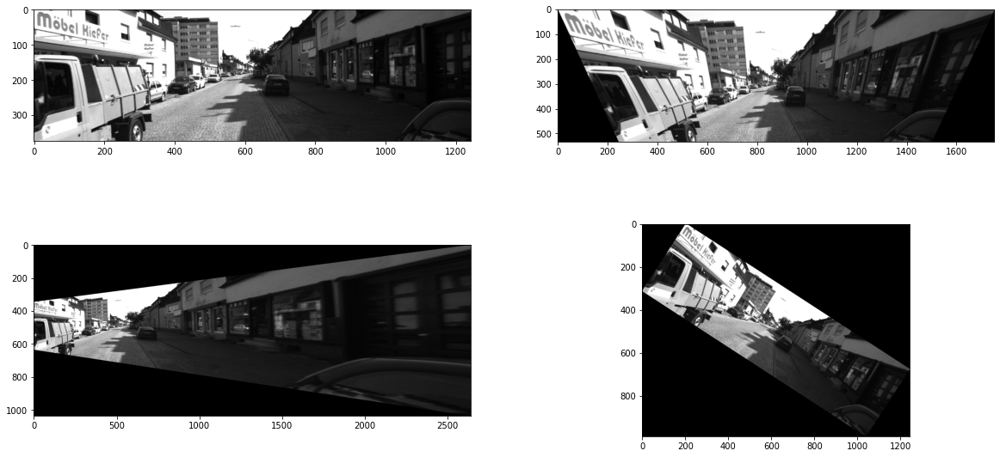

In [ ]:
R_z = Rotation.from_euler('z', 33, degrees=True).as_matrix()
R_y = Rotation.from_euler('y', 33, degrees=True).as_matrix()
R_x = Rotation.from_euler('x', 33, degrees=True).as_matrix()

H_right = get_rectification_homography (K_rect_03.copy(), R_x, f_scale=1)
image_2_rot_x, offset = my_warp (image_2, H_right)
#print(offset)

H_right = get_rectification_homography (K_rect_03.copy(), R_y, f_scale=1)
image_2_rot_y, offset = my_warp (image_2, H_right)

H_right = get_rectification_homography (K_rect_03.copy(), R_z, f_scale=1)
image_2_rot_z, offset = my_warp (image_2, H_right)

print('CAN YOU FIGURE OUT THE ROTATION AXES?')
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)
fig.set_size_inches(20, 10)
ax1.imshow(image_2, 'gray')
ax2.imshow(image_2_rot_x, 'gray')
ax3.imshow(image_2_rot_y, 'gray')
ax4.imshow(image_2_rot_z, 'gray');

# Rectification -- How can you make the epiolar lines horizontal? (advanced material)

* This will simplify the matching process for dense depth.

* Some sets of slides on this topic include

1. http://www.cs.cmu.edu/~16385/s17/Slides/13.1_Stereo_Rectification.pdf

2. http://people.scs.carleton.ca/~c_shu/Courses/comp4900d/notes/rectification.pdf

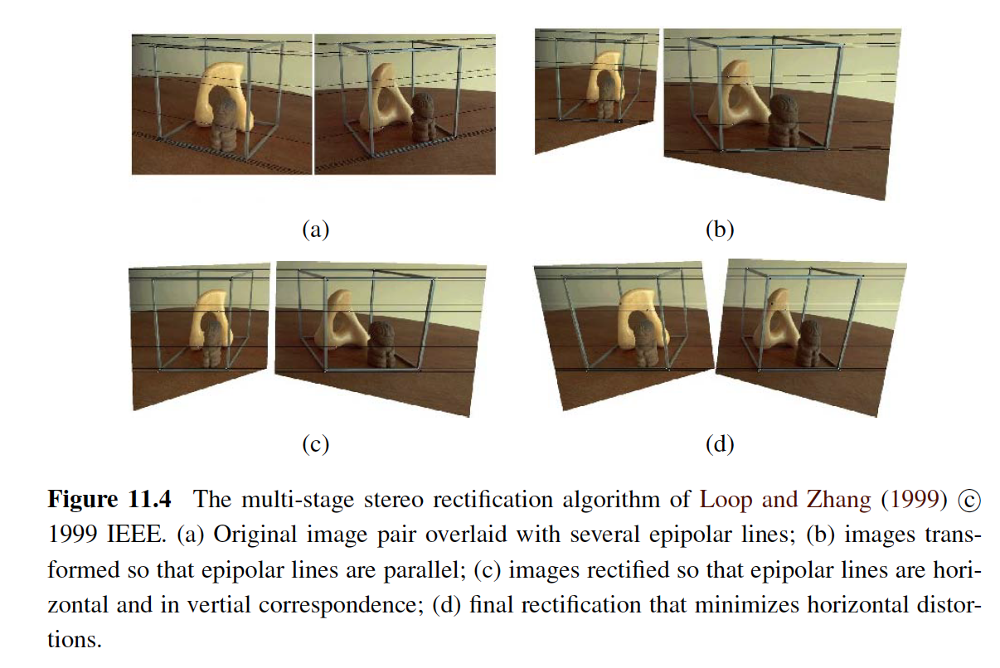

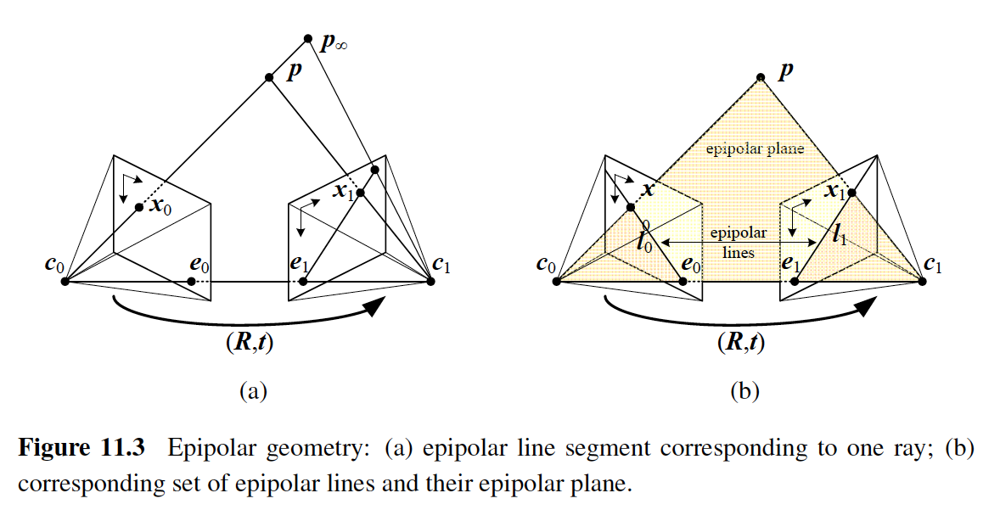

# Epipole

* Except for the epipole, only one epipolar line goes through an image point. All epipolar lines pass through the **epipole**.

* If a point is an epipole in the left image, $\mathbf{e_0}$, then it should satisfy the epipolar constraint equation for **all** points ($\tilde{\mathbf{x_1}}$) in the right image.

\begin{eqnarray}
 \tilde{\mathbf{x_1}}^T \mathbf{E} \tilde{\mathbf{e_0}} & = & 0
\end{eqnarray}

* The only way this relationship can be satisfied is when $\mathbf{E} \tilde{\mathbf{e_0}} = 0$. 

* The solution is the vector, $\tilde{\mathbf{e_0}}$,  that minimizes $||\mathbf{E} \tilde{\mathbf{e_0}}||^2$.

* The (homogenous coordinates) of the right epipole are given by the eigenvector with the smallest eigenvalue of the matrix $\mathbf{E}^T\mathbf{E}$. 

* Using similar reasoning, the right epipole would satisfy $ \tilde{\mathbf{e_1}}^T \mathbf{E} = 0$ or equivalently, $\mathbf{E}^T \tilde{\mathbf{e_1}} = 0$. The right epipole will be given by the eigenvector corresponding to the smallest eigenvalue of the matrix $\mathbf{E}\mathbf{E}^T$.

* Instead of computing eigendecomposition twice, we can use singular value decomposition (SVD) to compute the two eigenvectors simultaneously. The SVD of the matrix $\mathbf{E}$ expresses it as the product of three matrices: $\mathbf{E} = \mathbf{U D V}^T $, where $\mathbf{D}$ is a diagonal matrix of **singular values** (not eigenvalues, but related). The matrices $\mathbf{U}$ and $\mathbf{V}$ are orthonormal matrices whose columns correspond to the respective singular value in $\mathbf{D}$. 

* The eigenvectors of $\mathbf{E}^T \mathbf{E}$ make up the columns of $\mathbf{V}$ , the eigenvectors of  $\mathbf{E} \mathbf{E}^T$  make up the columns of $\mathbf{U}$.

* The left epipole ($\mathbf{e_0}$) can be estimated by the column of $\mathbf{V}$ associated with the smallest singular value.

* The right epipole ($\mathbf{e_1}$) can be estimated by the column of $\mathbf{U}$ associated with the smallest singular value.

* **The (homogenous representation of the) epipole will coincide with the translation vector.**

* What is the epipole for parallel stereo?



## Code: Compute epipoles

In [ ]:
def compute_epipoles (E) :
    ''' returns left and right epipoles given the essential matrix
        The epipoles will be specified in homogenous coordinates.
        There will be uncertainty about the scale and sign of these vectors.
        However, once they are converted to non-homogenous representation, into image coordinates, this scale 
        factor and sign will cancel out. However, if we use it to indicate 3D quantities such as translation, we have
        to be factor these aspects into the interpretation.'''
    U, D, VT = np.linalg.svd(E)
    print(D)
    e_l = VT[2, :] 
    e_r = U[:,2] 
    return (e_l, e_r)

# Rectification algorithm

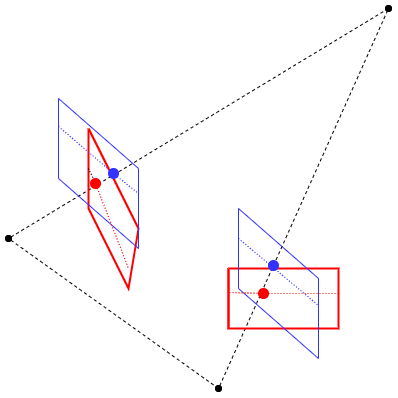

* Reproject image planes onto a standard plane parallel to the line between camera centers.

>> 1. Rotate the left camera by $\mathbf{R}^T$ (or the right camera by $\mathbf{R}$) to align the camera coordinate system orientation between the two cameras. 

>> 2. Rotate using $\mathbf{R}_{rect}^{left}$) the left camera so that the image plane is parallel to the line joining the two cameras, i.e., the left epipole will be at infinity.

>> 3. Rotate using $\mathbf{R}_{rect}^{right}$) the right camera so that the right epipole is at infinity 

>> 4. Adjust the scale (focal length to fit the image)

* We construct $\mathbf{R}_{rect}^{left}$ (for left camera) as follows.

>> We want the $x$-axis after rotation to be along the epipole of the left image, $\mathbf{e_0}$, or in the translation vector direction between the two cameras. Let $\mathbf{r_1} = \frac{1}{||\mathbf{e_0}||} \mathbf{e_0}$ be this unit vector.

>> The $y$-axis will be perpendicular to this $\mathbf{e_0}$ vector and the vector through the image center $\begin{bmatrix} 0 \\ 0 \\ 1 \end{bmatrix}$. Or equivalently, the $y$-axis will be along the cross-product of these two vectors: $\mathbf{r_2} = \frac{1}{\sqrt{e_{0x}^2 + e_{0y}^2}} \begin{bmatrix} - e_{0y} \\ e_{0x} \\ 0 \end{bmatrix}$

>> The final $z$ axis should be along the cross-product of the vectors along the $x$-axis and the $y$-axis. Let, $\mathbf{r_3} = \mathbf{r_1} \times \mathbf{r_2} $


>> **Observation:** A rotation matrix rotates the three axes along the axes specified by the rows of the matrix. So, place the above 3 vectors as the rows of the rotation matrix we need.

\begin{equation}
\mathbf{R}_{rect}^{left} = \begin{bmatrix}
\mathbf{r_1}^T \\
\mathbf{r_2}^T \\
\mathbf{r_3}^T 
\end{bmatrix}
\end{equation}

* Using analogous steps we construct the $\mathbf{R}_{rect}^{right}$ matrix to align the right camera.


## Code: Rotation to align along epipole 

In [ ]:
def compute_R_rectification (epipole) :
    '''Compute the rotation matrix that will align the x-direction of the camera 
        along the epiole direction, the move the y-axis and z-axis accordingly''' 
    # Rotation to to align image plane along the epipole
    r_1 = epipole
    r_1 /= np.linalg.norm(r_1)  #normalize
    r_2 = np.array([-r_1[1], r_1[0], 0])  # [0, 0, 1](z-axis) X epipole(x-axis)
    r_2 /= np.linalg.norm(r_2) #normalize
    r_3 = np.cross(r_1, r_2)  #get vector orthogonal to r_1 and r_2
    R_rectification = np.row_stack((r_1, r_2, r_3))
    # the signs of the rows of the rotation matrix might be off
    # enforce diagonal sign to be positive
    #D = np.diag(np.sign(np.diag(R_rect )));
    #R_rect  = D @ R_rect ;
    return (R_rectification)

## Code: Rectify General Stereo Image pairs

Essential matrix:
 [[ 5.9448 -6.9039  8.3612]
 [10.1736  0.8946  3.9693]
 [-7.812  -9.8714  4.4239]]
Fundamental matrix:
 [[ 0.     -0.      0.004 ]
 [ 0.      0.     -0.0012]
 [-0.0079 -0.0037  8.7071]]
[15.0169 15.0169  0.    ]

Left epipole: [ 0.3372 -0.5941 -0.7303],    R @ epipole_left:   [ 0.5674 -0.6838 -0.4588]
Right epipole: [ 0.5674 -0.6838 -0.4588],  R^T @ epipole_right:[ 0.3372 -0.5941 -0.7303]
Translation(T): (w.r.t. right camera)- should be same (-ve) as right epipole [-0.5674  0.6838  0.4588]
R=
[[ 0.8579  0.1398 -0.4945]
 [-0.117   0.9902  0.0768]
 [ 0.5004 -0.008   0.8658]]
 Rotation Euler angles (xyz):[ -0.53   -30.0261  -7.7688] degrees

R_rect_left=
[[ 0.3372 -0.5941 -0.7303]
 [ 0.8697  0.4936  0.    ]
 [ 0.3605 -0.6351  0.6831]]
 Rotation angles (xyz): [-42.9154 -21.1285  68.809 ] degrees

R_rect_right=
[[ 0.5674 -0.6838 -0.4588]
 [ 0.7696  0.6385  0.    ]
 [ 0.293  -0.3531  0.8885]]
 Rotation angles (xyz): [-21.6711 -17.0348  53.6009] degrees
Offset top, left corn

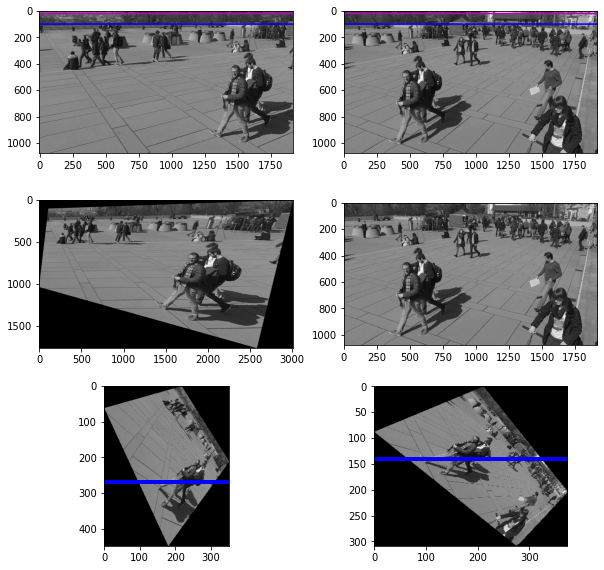

In [ ]:
''' Read in the images '''
image_1 = io.imread(data_dir+'Wildtrack/C4/00000015.png')
image_2 = io.imread(data_dir+'Wildtrack/C1/00000015.png')
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB) # change from scikit image to cv2 format
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY) # change from color to gray
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

E, F, R, T = compute_essential_fundamental_matrices (R_list[3], T_list[3], K_list[3], R_list[0], T_list[0], K_list[0])
print('Essential matrix:\n', E)
print('Fundamental matrix:\n', F)
K_left = K_list[3]
K_right = K_list[0]

# Compute epioles from essential matrix E
epipole_left, epipole_right = compute_epipoles (E)
# there is sign uncertainty of these vector, pick the sign so that the first entry is positive
epipole_left *= np.sign(epipole_left[0])
epipole_right *= np.sign(epipole_right[0])
print('\nLeft epipole: {},    R @ epipole_left:   {}'.format(epipole_left, R @ epipole_left))
print(   'Right epipole: {},  R^T @ epipole_right:{}'.format(epipole_right, R.transpose() @ epipole_right))
print('Translation(T): (w.r.t. right camera)- should be same (-ve) as right epipole', T.transpose()/np.linalg.norm(T))

R_rect_left= compute_R_rectification (epipole_left) 
R_rect_right= compute_R_rectification (epipole_right) 
print('R=\n{}\n Rotation Euler angles (xyz):{} degrees'.format(R, Rotation.from_matrix(R).as_euler('xyz', degrees=True)))
print('\nR_rect_left=\n{}\n Rotation angles (xyz): {} degrees'.format(R_rect_left, Rotation.from_matrix(R_rect_left).as_euler('xyz', degrees=True)))
print('\nR_rect_right=\n{}\n Rotation angles (xyz): {} degrees'.format(R_rect_right, Rotation.from_matrix(R_rect_right).as_euler('xyz', degrees=True)))


# Rotate left camera to align coordinates with right camera using R^T
H_R = get_rectification_homography (K_left.copy(), R.transpose(), f_scale=1)
image_1_aligned, offset_2 = my_warp (image_1, H_R)
print(offset_2)

# Align left image plane to be parallel to be parallel to epipole using R_rect
# Note that in the code below we perform R_rect*R^T on image_1 not just R_rect on 
# image_1_aligned. Mathematically the effect is the same, however, we end up doing
# a bit more computational work! This is because of the way we return 
# images from my_warp. The center of the image returned by my_warp is no longer 
# the optic center of the camera, there is an offset. So, the original K matrix will not
# work for this warped image, such as image_1_aligned.
H_left = get_rectification_homography (K_left.copy(),  R_rect_left @ R.transpose(), f_scale=8)
image_1_rectified, offset_1 = my_warp (image_1, H_left)
print(offset_1)

# Align right image plane to be parallel to be parallel to epipole using R_rect
H_right = get_rectification_homography (K_right.copy(),  R_rect_right , f_scale=8)
image_2_rectified, offset_2 = my_warp (image_2, H_right)
print(offset_2)

'''------------------------ DISPLAY---------------- '''
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2)
fig.set_size_inches(10, 10)

ax1.imshow(image_1, 'gray')
ax1.plot(np.arange(0, image_2.shape[1]), 20*np.ones((image_2.shape[1],)), 'm')
ax1.plot(np.arange(0, image_2.shape[1]), 100*np.ones((image_2.shape[1],)), 'b')

ax2.imshow(image_2, 'gray')
ax2.plot(np.arange(0, image_2.shape[1]), 20*np.ones((image_2.shape[1],)), 'm')
ax2.plot(np.arange(0, image_2.shape[1]), 100*np.ones((image_2.shape[1],)), 'b')

ax3.imshow(image_1_aligned, 'gray')
ax4.imshow(image_2, 'gray')

ax5.imshow(image_1_rectified, 'gray')
ax5.plot(np.arange(0, image_1_rectified.shape[1]), 270*np.ones((image_1_rectified.shape[1],)), 'b', linewidth=4)

ax6.imshow(image_2_rectified, 'gray')
ax6.plot(np.arange(0, image_2_rectified.shape[1]), 140*np.ones((image_2_rectified.shape[1],)), 'b', linewidth=4)